In [0]:
import cv2
import os
import matplotlib.pyplot as plt
from keras.preprocessing import image
import numpy as np

Using TensorFlow backend.


In [0]:
# !pip install opencv-python==3.4.2.16
# !pip install opencv-contrib-python==3.4.2.16

In [0]:
nef_images_path = 'data/Nefertiti'
leo_images_path = 'data/Leo'

nef_img_names = os.listdir(nef_images_path)
leo_img_names = os.listdir(leo_images_path)

In [0]:
DETECTOR_METHOD_FAST = "fast"
DETECTOR_METHOD_SIFT = "sift"
DETECTOR_METHOD_HARRIS = "harris"

DESCRIPTOR_METHOD_BRIEF = "brief"
DESCRIPTOR_METHOD_SIFT = "sift"

def get_image_description(img, threshold = 75, 
                          detector = DETECTOR_METHOD_FAST, 
                          descriptor = DESCRIPTOR_METHOD_SIFT,
                          drawDebug = False):
    img_array = image.img_to_array(img)
    img_grayscale = cv2.cvtColor(img_array, cv2.COLOR_RGB2GRAY).astype(np.uint8)
    
    if detector == DETECTOR_METHOD_HARRIS:
        keypoints = []
        responses = cv2.cornerHarris(img_grayscale, 2, 3, 0.04)
        for x in (-responses.flatten()).argsort()[:threshold]:
            indices = np.unravel_index(x, responses.shape)
            keypoints.append(cv2.KeyPoint(indices[1], indices[0], 17))
    elif detector == DETECTOR_METHOD_SIFT:
        feat = cv2.xfeatures2d.SIFT_create(threshold)
        keypoints = feat.detect(img_grayscale, None)
    elif detector == DETECTOR_METHOD_FAST:
        feat = cv2.FastFeatureDetector_create(threshold)
        keypoints = feat.detect(img_grayscale, None)
    else:
        raise Exception("Unknown detector")

    if drawDebug:
        img_array_kp = img_array.copy().astype(np.uint8)
        cv2.drawKeypoints(img_array_kp, keypoints, img_array_kp, (0, 255, 0))
        plt.axis('off')
        plt.imshow(img_array_kp)
        plt.show()
    
    if descriptor == DESCRIPTOR_METHOD_SIFT:
        descriptor = cv2.xfeatures2d.SIFT_create()
    else:
        descriptor = cv2.xfeatures2d.BriefDescriptorExtractor_create()
    return img_array, descriptor.compute(img_grayscale, keypoints)

def keypoint_match(pic, pattern, pic_desc, pattern_desc, drawDebug = False, detector=None, img_name=None):
    bf = cv2.BFMatcher()
    matches = bf.match(pattern_desc[1], pic_desc[1])
    
    if drawDebug:
        plt.figure(figsize=(10, 10))
        plt.axis('off')
        plt.imshow(cv2.drawMatches(pattern, pattern_desc[0], pic, pic_desc[0], matches, 0,
                                   flags=0, matchColor=(0, 255, 0), singlePointColor=(255, 0, 0)).astype(np.uint8))
        if detector != None and img_name != None: 
            plt.title(detector + ' ' + img_name)
        plt.show()
    return matches

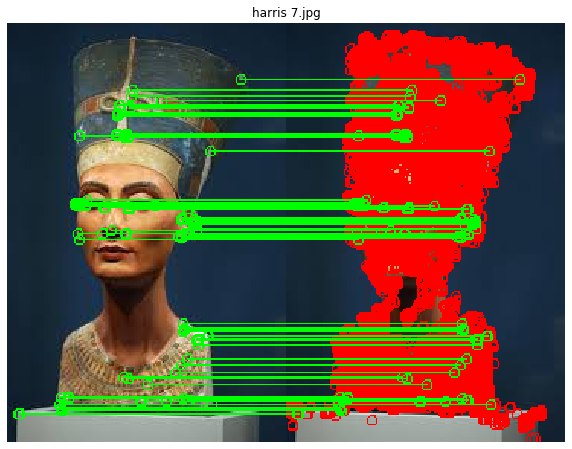

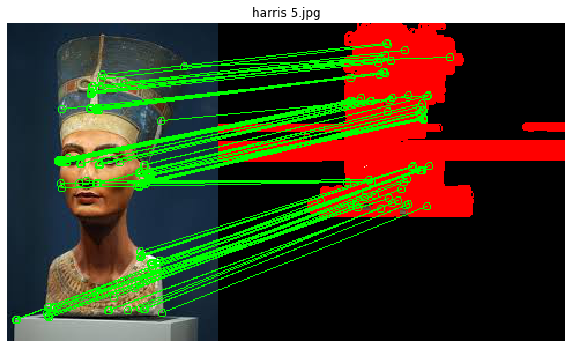

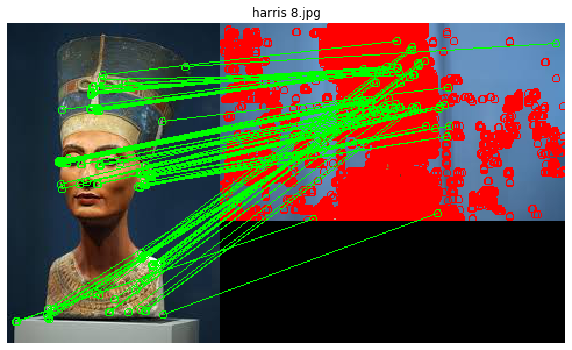

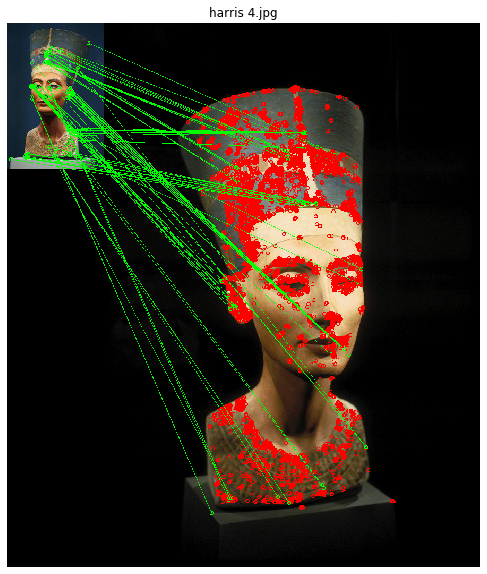

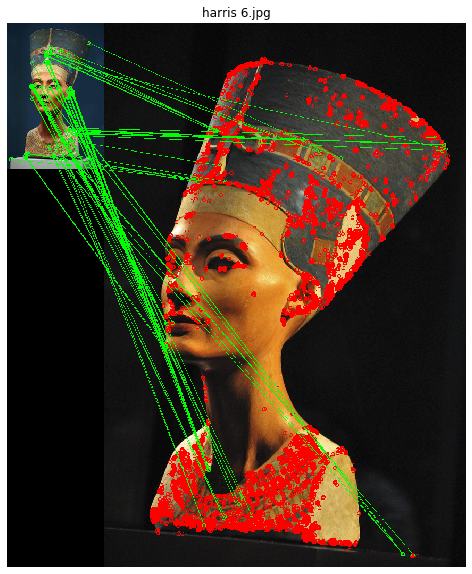

...

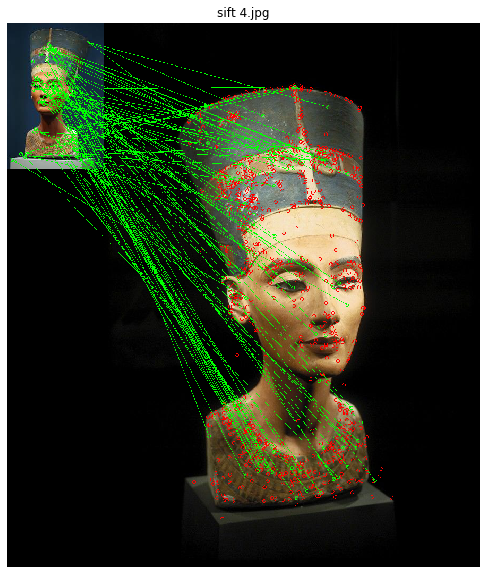

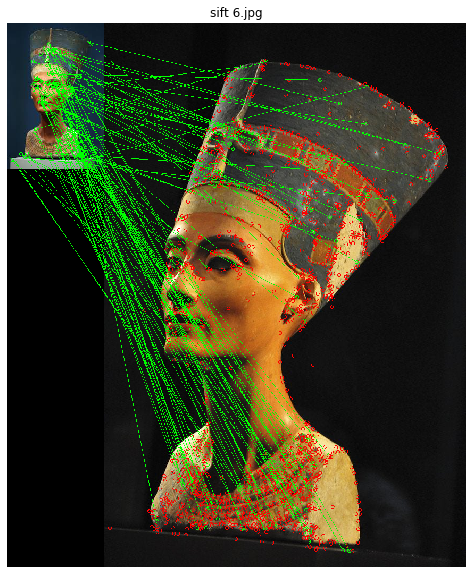

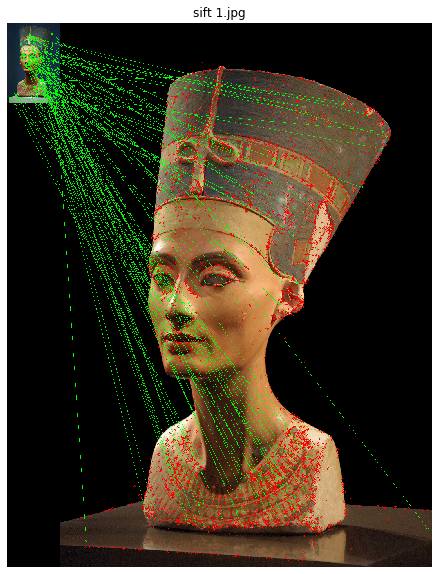

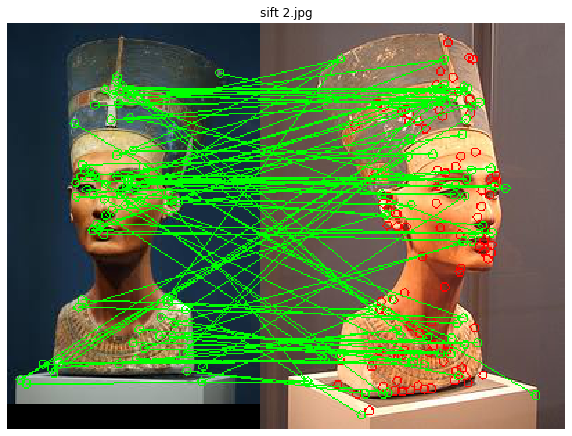

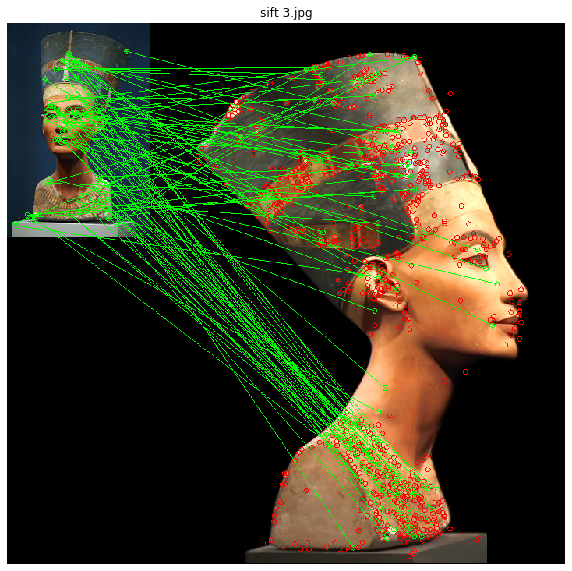

In [0]:
for detector, t_pattern, t_img in [(DETECTOR_METHOD_HARRIS, 100, 10000), (DETECTOR_METHOD_FAST, 10, 10), (DETECTOR_METHOD_SIFT, 100, 5000)]:
    for img in nef_img_names:
        pattern, pattern_desc = get_image_description(image.load_img(nef_images_path + '/' + 
                                                                     nef_img_names[0]), t_pattern, detector=detector, drawDebug=False)
        pic, pic_desc = get_image_description(image.load_img(nef_images_path + '/' + img), t_img, detector=detector)
        matches = keypoint_match(pic, pattern, pic_desc, pattern_desc, True, detector, img)
        plt.show()

### Bust of Nefertiti

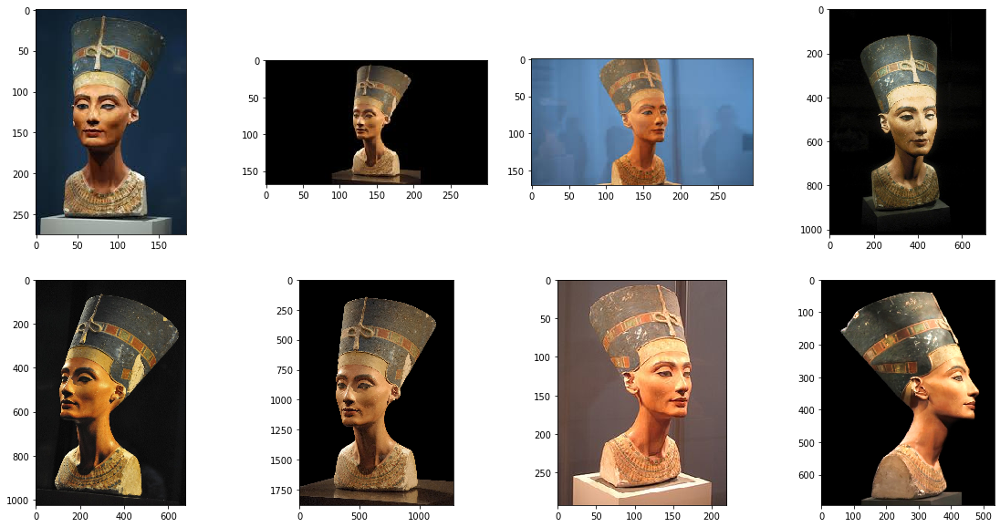

In [0]:
# visualize nefetiti images
plt.figure(figsize=(20,10))
for i in range(len(nef_img_names)):
    ax= plt.subplot(2,4 ,i+1)
    img = cv2.imread(nef_images_path + '/' + nef_img_names[i])
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(img_rgb)

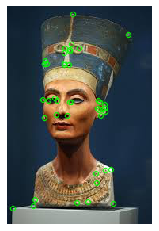

In [0]:
pattern, pattern_desc = get_image_description(image.load_img(nef_images_path + '/' + 
                                                             nef_img_names[0]), drawDebug = True)

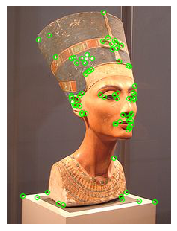

In [0]:
pic, pic_desc = get_image_description(image.load_img(nef_images_path + '/' + 
                                                             nef_img_names[6]), drawDebug = True)

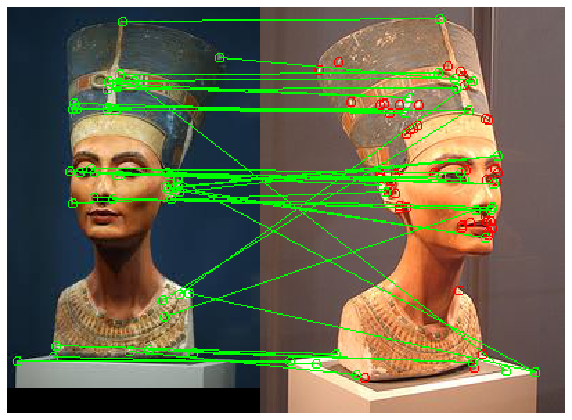

In [0]:
matches = keypoint_match(pic, pattern, pic_desc, pattern_desc, True)

### Leonardo dikaprio

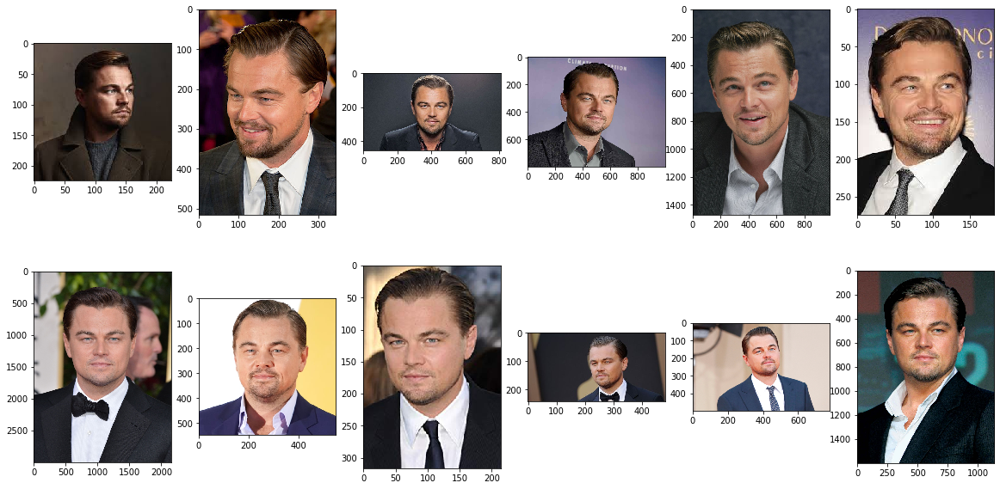

In [0]:
# visualize Leo
plt.figure(figsize=(20,10))
for i in range(len(leo_img_names)):
    ax= plt.subplot(2,6 ,i+1)
    img = cv2.imread(leo_images_path + '/' + leo_img_names[i])
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(img_rgb)

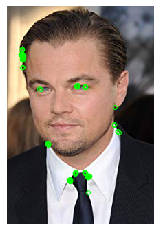

In [0]:
pattern, pattern_desc = get_image_description(image.load_img(leo_images_path + '/' + 
                                                             leo_img_names[8]), detector = 'harris', drawDebug = True)

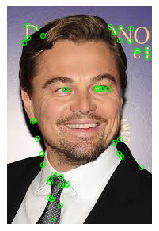

In [0]:
pic, pic_desc = get_image_description(image.load_img(leo_images_path + '/' + 
                                                     leo_img_names[5]), drawDebug = True)

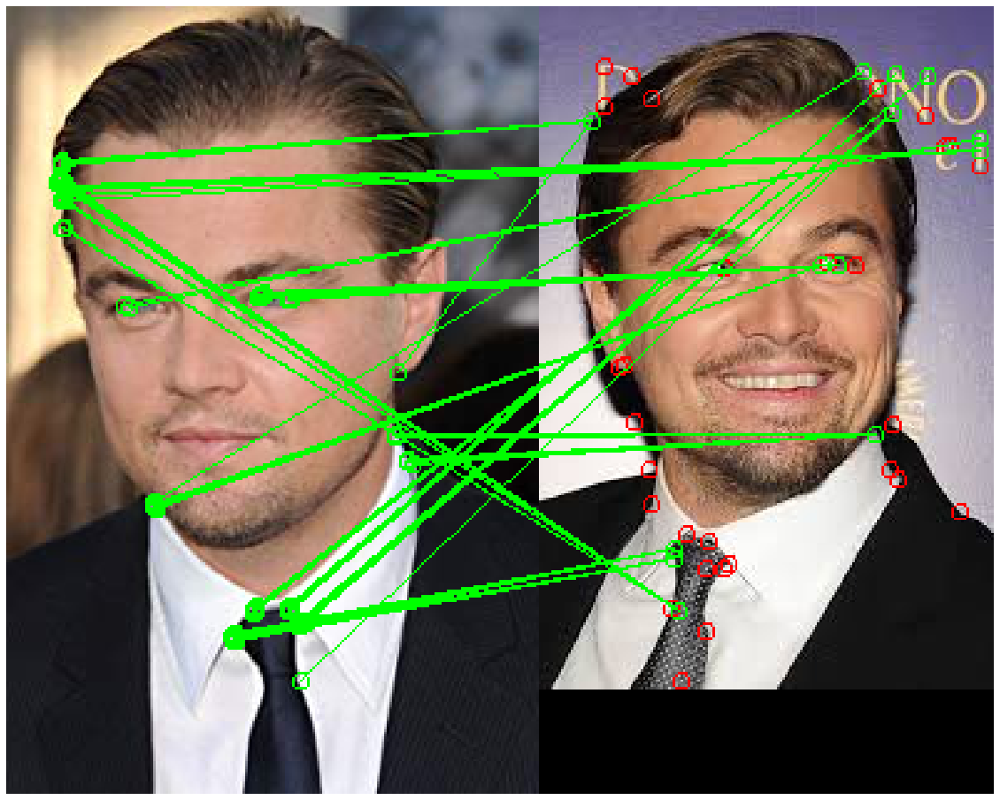

In [0]:
matches = keypoint_match(pic, pattern, pic_desc, pattern_desc, True)

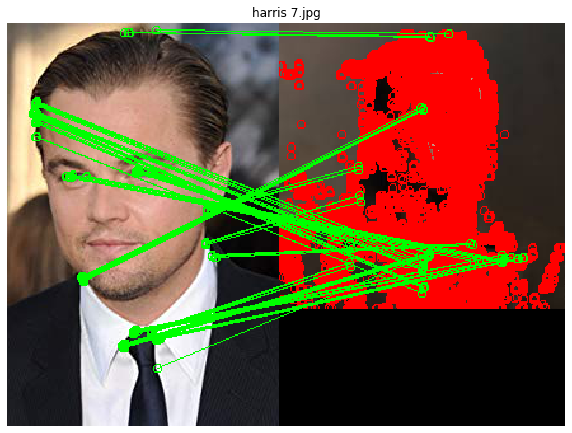

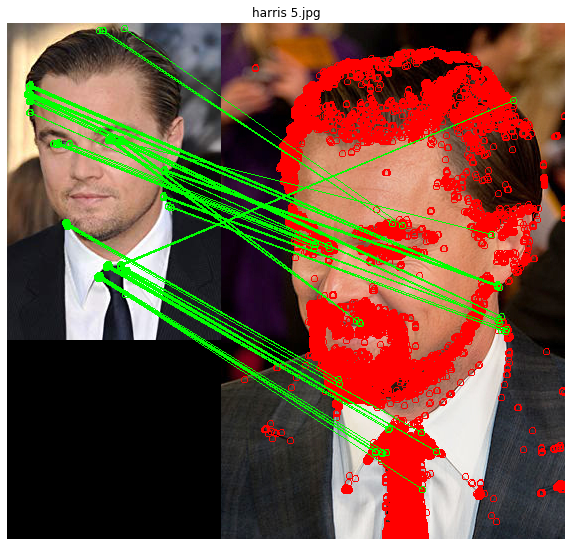

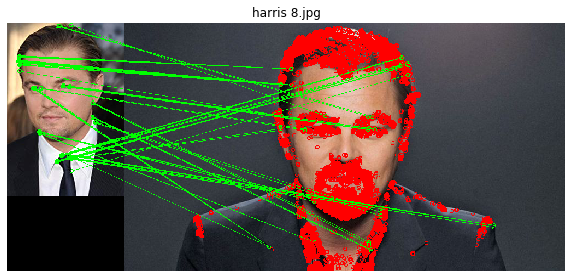

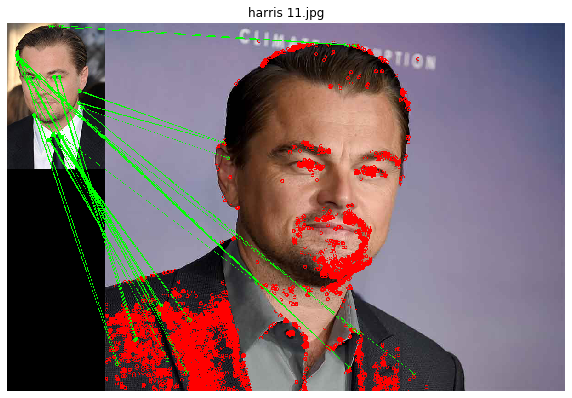

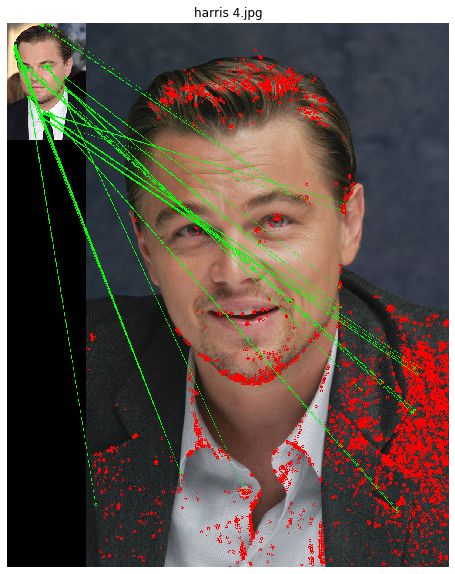

...

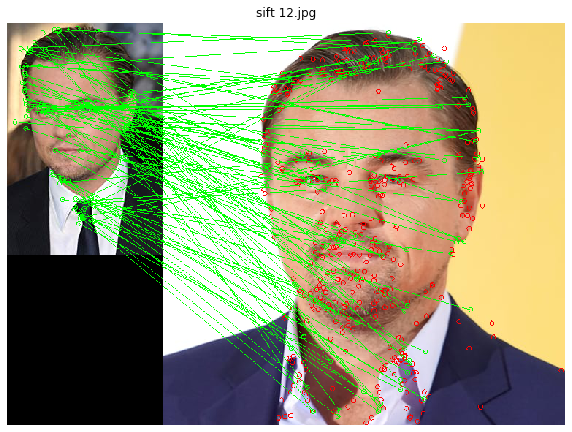

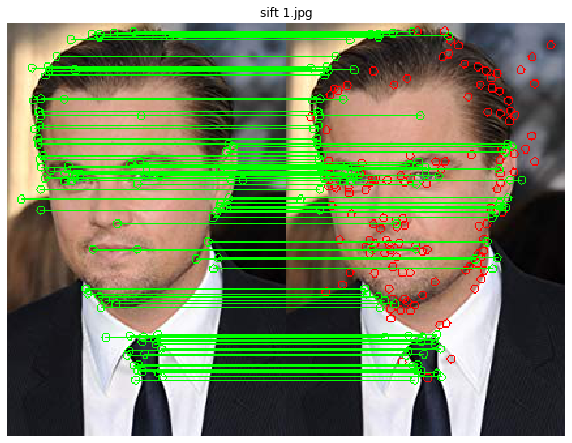

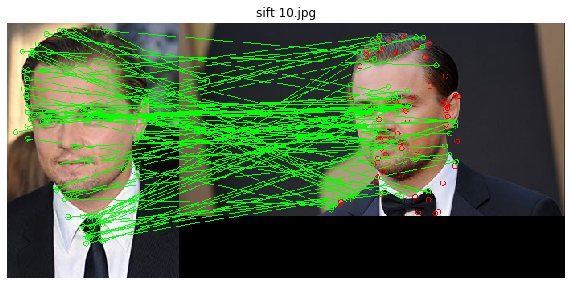

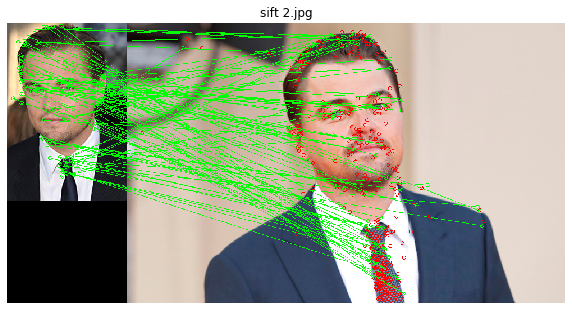

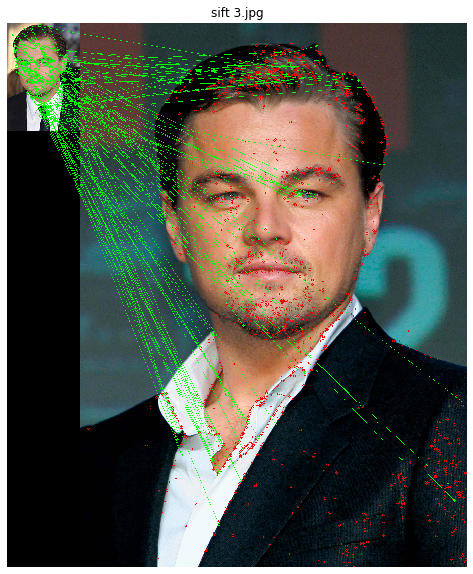

In [0]:
for detector, t_pattern, t_img in [(DETECTOR_METHOD_HARRIS, 100, 10000), (DETECTOR_METHOD_FAST, 10, 10), (DETECTOR_METHOD_SIFT, 100, 5000)]:
    for img in leo_img_names:
        pattern, pattern_desc = get_image_description(image.load_img(leo_images_path + '/' + 
                                                                     leo_img_names[8]), t_pattern, detector=detector, drawDebug=False)
        pic, pic_desc = get_image_description(image.load_img(leo_images_path + '/' + img), t_img, detector=detector)
        matches = keypoint_match(pic, pattern, pic_desc, pattern_desc, True, detector, img)
        plt.show()